**Differentially private maximum-volume inscribed ellipsoid** 

This tutorial details the private computation of a maximum-volume ellipsoid inscribed into a polyhedral set, based on the theory and results of the following preprint:

[Privacy-Preserving Convex Optimization: When Differential Privacy Meets Stochastic Programming]() (2022) by Vladimir Dvorkin, Ferdinando Fioretto, Pascal Van Hentenryck, Pierre Pinson and Jalal Kazempour. 

***

In [25]:
# activate project environment
using Pkg
Pkg.activate()

# load packages 
using Plots
using Polyhedra, CDDLib
using JuMP, Mosek, MosekTools
using LinearAlgebra, Distributions, Random

  Activating environment at `~/.julia/environments/v1.6/Project.toml`


In [26]:
# define experiment settings
set = Dict( :n => 2, :b_var => 0.01,                 # dataset parameters
            :η => 0.1, :β => 0.1, :p => 2, :Δ => [], # senstivity parameters
            :η_cc => 0.1, :β_cc => 0.1,              # chance constraints parameters
            :ε => 1, :δ => 0.1,                      # differential privacy parameters
            :ξ_v => [], :Σ => [])                    # perturbation parameters

Dict{Symbol, Any} with 12 entries:
  :p     => 2
  :n     => 2
  :ε     => 1
  :Δ     => Any[]
  :Σ     => Any[]
  :η     => 0.1
  :b_var => 0.01
  :η_cc  => 0.1
  :δ     => 0.1
  :β     => 0.1
  :β_cc  => 0.1
  :ξ_v   => Any[]

The goal here is to compute a maximum-volume ellipsoid
$$\mathcal{E} = \{x=Yu+z\;|\;\lVert u\rVert\leqslant1\}$$
with parameters $Y$ (affine transformation of a unit circle) and $z$ (center), inscribed into a closed and non-empty polyhedral set
$$\mathcal{U} = \{x\in\mathbb{R}^{n}\;|\;a_{i}^{\top}x\leqslant b_{i},\;\forall i=1,\dots,m\}.$$
According to [Ben-Tal, A. & Nemirovski, A. Lectures on modern convex optimization (2012). SIAM](https://www.ttic.edu/optimization2012/Lect_ModConvOpt.pdf), the parameters of this ellipsoid are found by solving the following semidefinite program: 
\begin{align*}
   \underset{z,Y}{\text{maximize}}\quad&\text{det}[Y]^{\frac{1}{n}}\\
    \text{subject to}\quad&\lVert Ya_{i}\rVert_{2}\leqslant b_{i} - a_{i}^{\top}z, \quad\forall i = 1,\dots, m,\quad Y\succcurlyeq 0.
\end{align*}

We implement this program in a conic form in Julia using JuMP optimization package, Mosek conic solver, and Polyhedra package. We first build constraint set $U$ from a feasible space of a JuMP model with 7 inequalities using function

In [27]:
function polydata(n, γ = zeros(7))
    model = Model(optimizer_with_attributes(Mosek.Optimizer, "LOG" => 0))
    @variable(model, x[1:n])
    @objective(model, Min, x'diagm(ones(n))'x)

    @constraint(model, con1, x[1] >= 0 + γ[1])
    @constraint(model, con2, x[2] >= -1 + γ[2])
    @constraint(model, con3, x[1] + x[2] <= 10 + γ[3])
    @constraint(model, con4, x[1] + x[2] >= 1 + γ[4])
    @constraint(model, con5, x[1] - x[2] <= 7 + γ[5])
    @constraint(model, con6, - x[1] + 1.5*x[2] <= 7 + γ[6])
    @constraint(model, con7, x[1] <= 7 + γ[7])

    optimize!(model)
    # create a polyhedron from the feasible set of a JuMP model
    poly = polyhedron(model, CDDLib.Library(:exact))
    # obtain H-representation of the polyhedron
    hr = MixedMatHRep(hrep(poly))
    A = hr.A
    b = hr.b
    # obtain V-representation of the polyhedron
    vr = vrep(poly)
    vr = MixedMatVRep(vr)
    p = vr.V
    return graph_data = Dict(:A => Float64.(A), :b => Float64.(b), :p => Float64.(p), :poly => poly)
end

polyhedral_data = polydata(set[:n])

Dict{Symbol, Any} with 4 entries:
  :b    => [10.0, 7.0, 7.0, 7.0, 0.0, 1.0, -1.0]
  :p    => [0.0 4.66667; 0.0 1.0; … ; 7.0 3.0; 3.2 6.8]
  :A    => [1.0 1.0; 1.0 -1.0; … ; 0.0 -1.0; -1.0 -1.0]
  :poly => HalfSpace(Rational{BigInt}[1//1, 1//1], 10//1) ∩ HalfSpace(Rational{…

 ... and then use the hyperplane representation of this feasible region to fit the ellipsoid with the following function

In [28]:
function lowner_john_inner_ellipsoid(A,b)
    """
    Löwner-John inner ellipsoid:
        the function takes H-representation (A,b) of a polytope and
        outputs the parameters of the maximum volume inscribed ellipsoid.

        polyhedral set S:
        U = { x ∈ Rn | ai' x ⩽ bi, i= 1,...,m }

        Proposition 3.7.1 [BenTalN01]
            ... Then the largest volume ellipsoid contained in U is
            E = { x = Y∗u + z∗ | uTu ≤1 }, where (Y∗,z∗) are from

            maximize    t                                           (1.0)
                s.t.    t ⩽ (DetY)^1/n                              (1.1)
                        Y - PSD                                     (1.2)
                        || Y * ai ||_2 ≤ bi −ai' * z, i = 1,...,m   (1.3)
                        Y ∈ S^n, z ∈ Rn, t ∈ R                      (1.4)

        To model (1.1), refer to [Mosek, 6.2.3 Log-determinant]

            t ⩽ (DetY)^1/n <==> [Y B; B' diag(B)] - PSD             (2.1)
                                B is lower triangular               (2.2)
                                t ⩽ (Π_i={1,...,n} Bii)^1/n         (2.3)

            where (2.3) maximizes the geometric mean of the Bii variables. It
            can be modelled using power cone [Mosek, 4.2.4 Geometric mean] and
            MOI.GeometricMeanCone available with the MathOptInterface.jl

    [BenTalN01]	    A. Ben-Tal and A. Nemirovski. Lectures on Modern Convex
                    Optimization: Analysis, Algorithms, and Engineering Applications.
                    MPS/SIAM Series on Optimization. SIAM, 2001.
    [Mosek]         https://docs.mosek.com/modeling-cookbook/index.html
    """
    # model size
    m,n = size(A)
    # model declaraton
    model = Model(optimizer_with_attributes(Mosek.Optimizer, "LOG" => 0))
    # variables
    @variable(model, t)
    @variable(model, Y[1:n,1:n], PSD)
    @variable(model, z[1:n])
    @variable(model, B[1:n,1:n])
    # maximize the volume
    @objective(model, Max, t)
    # SOC constraint (1.3)
    @constraint(model, SOC[i=1:m], [ b[i] - (A[i,:]' * z) ; (A[i,:]'*Y)'] in SecondOrderCone())
    # PSD constraint (2.1)
    @constraint(model, [Y LowerTriangular(B); LowerTriangular(B)' diagm(diag(B))] in PSDCone())
    # Power cone costraint (2.3)
    @constraint(model, [t; vec([B[i,i] for i in 1:n])] in MOI.GeometricMeanCone(n+1))
    # optimize
    optimize!(model)
    status=termination_status(model)
    CPU_time = MOI.get(model, MOI.SolveTime())
    # return solution
    sol = Dict(:B => JuMP.value.(B), :Y => JuMP.value.(Y), :z => JuMP.value.(z), :CPU_time => CPU_time, :volume => 4/3*π*det(JuMP.value.(Y)), :sol => [JuMP.value.(z);vec(JuMP.value.(Y))])
    return sol
end
sol_det = lowner_john_inner_ellipsoid(polyhedral_data[:A],polyhedral_data[:b])

Dict{Symbol, Any} with 6 entries:
  :volume   => 47.5271
  :sol      => [3.5, 2.38034, 3.4652, -0.492336, -0.492336, 3.3443]
  :B        => [3.4652 0.0; -0.492336 3.27434]
  :CPU_time => 0.00121903
  :Y        => [3.4652 -0.492336; -0.492336 3.3443]
  :z        => [3.5, 2.38034]

Let's visualize the result

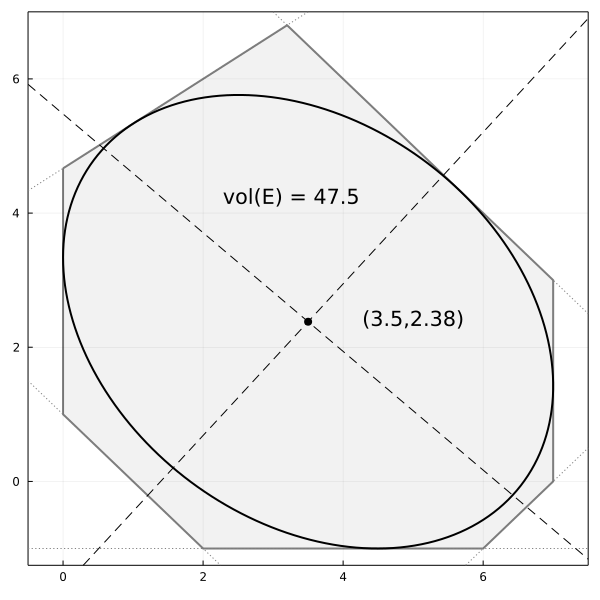

In [29]:
function make_static_plot(polyhedral_data,sol_ell)
    fig = plot(frame = :box, ylims=(-1.25,7), xlims=(-0.5,7.5), size = (600, 600))
    # plot the feasible set
    plot!(polyhedral_data[:poly], fillalpha=0.1, lw=2, c=:gray, alpha = 0.5)
    for i in 1:size(polyhedral_data[:A],1)
        f(x) = - (polyhedral_data[:A][i,1]*x - polyhedral_data[:b][i] )/polyhedral_data[:A][i,2]
        plot!(f,-1,10,style=:dot,c=:gray)
    end
    # plot the inner maximum volume ellipsoid
    plot!(t -> sol_ell[:Y][1,:]' * [cos(t),sin(t)] + sol_ell[:z][1],
          t -> sol_ell[:Y][2,:]' * [cos(t),sin(t)] + sol_ell[:z][2],
          0,2*pi, color=:black, lw=2)
    # add ellipsoid axises
    axis_1(x) = - eigvecs(sol_ell[:Y])[1,1]/eigvecs(sol_ell[:Y])[1,2] * (x - sol_ell[:z][1]) + sol_ell[:z][2]
    axis_2(x) = - eigvecs(sol_ell[:Y])[2,1]/eigvecs(sol_ell[:Y])[2,2] * (x - sol_ell[:z][1]) + sol_ell[:z][2]
    plot!(axis_1,-1,8,linestyle=:dash,c=:black)
    plot!(axis_2,-1,8,linestyle=:dash,c=:black)
    # plot barycenter
    plot!([sol_ell[:z][1]], [sol_ell[:z][2]], seriestype = :scatter, markershape = :circle, markersize = 5, markercolor=:black)
    annotate!([(sol_ell[:z][1]+1.5,sol_ell[:z][2]+0.05,text("($(round(sol_ell[:z][1],digits=2)),$(round(sol_ell[:z][2],digits=2)))", 10, :top, :black, Plots.font(14)))])
    # volume annotation
    annotate!([(3.25,4.25,text("vol(E) = $(round(sol_ell[:volume],digits=1))", 10, :top, :black, Plots.font(14)))])
    return fig
end

plo_det = make_static_plot(polyhedral_data,sol_det)

The solution to this ellipsoid is unique. To obfuscate the polyhedral set data in ellipsoid parameters, we use the Gaussian perturbation of ellipsoid parameters.

We first compute the sensitivity of ellipsoid parameters to problem data. Assuming that each hyperplane can vary within the range of $\pm$ ```b_var``` , we compute the sensitivity by solving many instances of the deterministic fitting problem (as many, as given by sample size requirement $S$, defined according to Proposition 3.2 and probabilistic parameters $\eta$ and $\beta$ in settings dictionary ```set```), using the following function:

In [30]:
function sensitivity(set)
    S = Int(ceil(1/(set[:η]*set[:β])))
    z_1 = zeros(6,S)
    z_2 = zeros(6,S)
    Random.seed!(1)
    γ = rand(Uniform(-set[:b_var],set[:b_var]),S,7,2)
    for s in 1:S
        polyhedral_data = polydata(set[:n],γ[s,:,1])
        sol_ell = lowner_john_inner_ellipsoid(polyhedral_data[:A],polyhedral_data[:b])
        z_1[:,s] .=  sol_ell[:sol]

        polyhedral_data = polydata(set[:n],γ[s,:,2])
        sol_ell_ = lowner_john_inner_ellipsoid(polyhedral_data[:A],polyhedral_data[:b])
        z_2[:,s] .=  sol_ell_[:sol]
    end

    Δ = [norm(z_1[:,s] .- z_2[:,s],set[:p]) for s in 1:S]

    return maximum(Δ)
end

set[:Δ] = sensitivity(set)

0.025244175733474126

We then calibrate the perturbation to the Gaussian distribution with zero mean and standard deviation
\
\
$$
\sigma=\sqrt{2\text{ln}(1.25/\delta)}\Delta_{2}/\varepsilon
$$
\
\
Using the standard output perturbation strategy of differential privacy, we obtain the following results

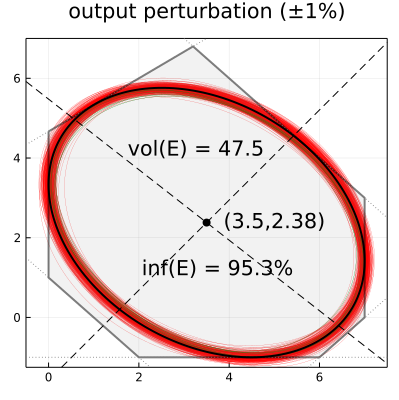

Dict{Symbol, Any} with 2 entries:
  :fig => Plot{Plots.GRBackend() n=312}
  :inf => 0.953333

In [31]:
function make_perurbed_plot(polyhedral_data,sol_ell,set,plot_title)
    fig = plot(frame = :box, ylims=(-1.25,7), xlims=(-0.5,7.5), size = (400, 400), title = plot_title, titlefontsize = 14)
    # plot private ellipsoids
    Random.seed!(3)
    ξ̂ = rand(Normal(0,sqrt(2*log(1.25/set[:δ]))*set[:Δ]/set[:ε]),6,1000)
    flag = 0
    for j in 1:300
      ξ_z_ = ξ̂[4:5,j]
      ξ_Z_ = [ξ̂[1,j] ξ̂[3,j]; ξ̂[3,j] ξ̂[2,j]]

      x_1 = [(sol_ell[:Y] .+ ξ_Z_)[1,:]' * [cos(t),sin(t)] + (sol_ell[:z][1] .+ ξ_z_[1]) for t in 0:0.05:2*pi]
      x_2 = [(sol_ell[:Y] .+ ξ_Z_)[2,:]' * [cos(t),sin(t)] + (sol_ell[:z][2] .+ ξ_z_[2]) for t in 0:0.05:2*pi]
      n = length(0:0.05:2*pi)
      sum(sum(polyhedral_data[:A]*[x_1[i];x_2[i]] .>= polyhedral_data[:b] for i in 1:n)) > 0 ? flag += 1 : 0

      if sum(sum(polyhedral_data[:A]*[x_1[i];x_2[i]] .>= polyhedral_data[:b] for i in 1:n)) > 0
          plot!(t -> (sol_ell[:Y] .+ ξ_Z_)[1,:]' * [cos(t),sin(t)] + (sol_ell[:z][1] .+ ξ_z_[1]),
                t -> (sol_ell[:Y] .+ ξ_Z_)[2,:]' * [cos(t),sin(t)] + (sol_ell[:z][2] .+ ξ_z_[2]),
                0,2*pi, color=:red, lw=0.15)
        else
            plot!(t -> (sol_ell[:Y] .+ ξ_Z_)[1,:]' * [cos(t),sin(t)] + (sol_ell[:z][1] .+ ξ_z_[1]),
                  t -> (sol_ell[:Y] .+ ξ_Z_)[2,:]' * [cos(t),sin(t)] + (sol_ell[:z][2] .+ ξ_z_[2]),
                  0,2*pi, color=:green, lw=0.25)
      end
    end
    # plot the feasible set
    plot!(polyhedral_data[:poly], fillalpha=0.1, lw=2, c=:gray, alpha = 0.5)
    for i in 1:size(polyhedral_data[:A],1)
        f(x) = - (polyhedral_data[:A][i,1]*x - polyhedral_data[:b][i] )/polyhedral_data[:A][i,2]
        plot!(f,-1,10,style=:dot,c=:gray)
    end
    # plot the inner maximum volume ellipsoid
    plot!(t -> sol_ell[:Y][1,:]' * [cos(t),sin(t)] + sol_ell[:z][1],
          t -> sol_ell[:Y][2,:]' * [cos(t),sin(t)] + sol_ell[:z][2],
          0,2*pi, color=:black, lw=2)
    # add ellipsoid axises
    axis_1(x) = - eigvecs(sol_ell[:Y])[1,1]/eigvecs(sol_ell[:Y])[1,2] * (x - sol_ell[:z][1]) + sol_ell[:z][2]
    axis_2(x) = - eigvecs(sol_ell[:Y])[2,1]/eigvecs(sol_ell[:Y])[2,2] * (x - sol_ell[:z][1]) + sol_ell[:z][2]
    plot!(axis_1,-1,8,linestyle=:dash,c=:black)
    plot!(axis_2,-1,8,linestyle=:dash,c=:black)
    # plot barycenter
    plot!([sol_ell[:z][1]], [sol_ell[:z][2]], seriestype = :scatter, markershape = :circle, markersize = 5, markercolor=:black)
    annotate!([(sol_ell[:z][1]+1.5,sol_ell[:z][2]+0.05,text("($(round(sol_ell[:z][1],digits=2)),$(round(sol_ell[:z][2],digits=2)))", 10, :top, :black, Plots.font(14)))])
    # volume annotation
    annotate!([(3.25,4.25,text("vol(E) = $(round(sol_ell[:volume],digits=1))", 10, :top, :black, Plots.font(14)))])

    annotate!([(3.75,1.25,text("inf(E) = $(round(sum(flag)/300*100,digits=1))%", 10, :top, :black, Plots.font(14)))])

    display(fig)
    return Dict(:fig => fig, :inf => sum(flag)/300)
end

# display output perturbation strategy
results_op_01 = make_perurbed_plot(polyhedral_data,sol_det,set,"output perturbation (±1%)") # "output perturbation (±1%)"

Observe, that the private inner ellipsoid are outside of the polyhedral set with probability $\approx$95\%, which is unsatisfactory. 

To program perturbation strategy, which explicitly internalizes feasibility requirement, requires solving the following stochastic counterpart of the deterministic fitting problem:   

$$
\begin{align*}
    \text{maximize}_{\overline{z},\overline{Y},Z,\tilde{Y}}\quad&\mathbb{E}\left[\text{det}[\overline{Y} + \tilde{Y}{\zeta}]^{\frac{1}{n}}\right]\\
    \text{subject to}\quad&
    \text{Pr}\left[
    \begin{array}{l}
    \overline{Y} + \tilde{Y}{\zeta}\succcurlyeq 0,\\
    \lVert(\overline{Y} + \tilde{Y}{\zeta})a_{i}\rVert_{2}\leqslant b_{i} - a_{i}^{\top}(\overline{z} + Z{\zeta}), \quad\forall i = 1,\dots, m
    \end{array}
    \right]\geqslant 1-\eta,\\
    &Z,\tilde{Y}\in \mathcal{X}_{\text{id}}^{\text{ell}},
\end{align*}
$$

where $\eta$ is a prescribed parameter from dictionary ```set```, and $\mathcal{X}_{\text{id}}^{\text{ell}}$ is an identity query constraint set to ensure data-independence of the random component of the private identity query. The chance constraint is reformulated in a sample based manner, by enforcing stochastic constraint on a finite set of vertices. 

In [32]:
function vertices(set)
    S = Int(ceil(1/set[:η_cc] * ℯ/(ℯ-1) * (2*5 - 1 + log(1/set[:β_cc]))))

    Random.seed!(5)
    ξ̂ = rand(Normal(0,sqrt(2*log(1.25/set[:δ]))*set[:Δ]/set[:ε]),5,S)

    ξ̅ = maximum(ξ̂,dims=2)
    ξ̲ = minimum(ξ̂,dims=2)

    # build JuMP optimization model
    model = Model(optimizer_with_attributes(Mosek.Optimizer, "LOG" => 0))
    @variable(model, ξ[1:5])
    @constraint(model, con[i=1:5], ξ̲[i] <= ξ[i] <= ξ̅[i])

    # create a polyhedron from the fesible set of JuMP model
    poly = polyhedron(model, CDDLib.Library(:exact))
    # obtain V-representation of the polyhedron
    vr = vrep(poly)
    vr = MixedMatVRep(vr)
    p = vr.V

    return Dict(:ξ_v => float(p)', :ξ => ξ̂)
end

function private_inner_ellipsoid(A,b,ξ)
    # model size
    m,n = size(A)
    p,k = size(ξ)
    # model declaraton
    model = Model(optimizer_with_attributes(Mosek.Optimizer, "LOG" => 0))

    ξ_z(s) = ξ[4:5,s]
    ξ_Y(s) = [ξ[1,s] ξ[3,s]; ξ[3,s] ξ[2,s]]

    @variable(model, t)
    @variable(model, Y[1:n,1:n])
    @variable(model, z[1:n])
    @variable(model, B[1:n,1:n])
    # maximize the volume
    @objective(model, Max, t)
    # SOC constraint (1.3)
    @constraint(model, SOC[i=1:m,s=1:k], [ b[i] - (Float64.(A[i,:])' * (z .+ ξ_z(s))) ; (Float64.(A[i,:])'* (Y .+ ξ_Y(s)))'] in SecondOrderCone())
    # PSD constraint (2.1)
    @constraint(model, con_1[s=1:k], [(Y .+ ξ_Y(s)) LowerTriangular(B); LowerTriangular(B)' diagm(diag(B))] in PSDCone())
    @constraint(model, con_2[s=1:k], (Y .+ ξ_Y(s)) in PSDCone())
    # Power cone costraint (2.3)
    @constraint(model, [t; vec([B[i,i] for i in 1:n])] in MOI.GeometricMeanCone(n+1))
    # optimize
    optimize!(model)
    status=termination_status(model)
    CPU_time = MOI.get(model, MOI.SolveTime())
    # return solution
    return sol = Dict(:Y => JuMP.value.(Y), :z => JuMP.value.(z), :CPU_time => CPU_time, :volume => 4/3*π*det(JuMP.value.(Y)), :sol => [JuMP.value.(z);vec(JuMP.value.(Y))])
end
vertex = vertices(set)
set[:ξ_v] = vertex[:ξ]
sol_sto =  private_inner_ellipsoid(polyhedral_data[:A],polyhedral_data[:b],set[:ξ_v])

Dict{Symbol, Any} with 5 entries:
  :volume   => 41.5486
  :sol      => [3.50664, 2.41059, 3.29287, -0.49994, -0.49994, 3.08816]
  :CPU_time => 0.20867
  :Y        => [3.29287 -0.49994; -0.49994 3.08816]
  :z        => [3.50664, 2.41059]

The the stochastic ellipsoid parameters are more robust perturbation, as seen with the following plot

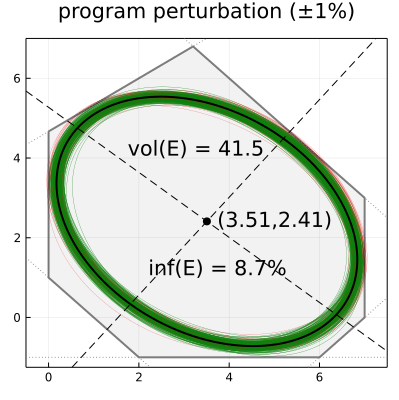

Dict{Symbol, Any} with 2 entries:
  :fig => Plot{Plots.GRBackend() n=312}
  :inf => 0.0866667

In [33]:
function make_perurbed_plot(polyhedral_data,sol_ell,set,plot_title)
    fig = plot(frame = :box, ylims=(-1.25,7), xlims=(-0.5,7.5), size = (400, 400), title = plot_title, titlefontsize = 14)
    # plot private ellipsoids
    Random.seed!(3)
    ξ̂ = rand(Normal(0,sqrt(2*log(1.25/set[:δ]))*set[:Δ]/set[:ε]),6,1000)
    flag = 0
    for j in 1:300
      ξ_z_ = ξ̂[4:5,j]
      ξ_Y_ = [ξ̂[1,j] ξ̂[3,j]; ξ̂[3,j] ξ̂[2,j]]

      x_1 = [(sol_ell[:Y] .+ ξ_Y_)[1,:]' * [cos(t),sin(t)] + (sol_ell[:z][1] .+ ξ_z_[1]) for t in 0:0.05:2*pi]
      x_2 = [(sol_ell[:Y] .+ ξ_Y_)[2,:]' * [cos(t),sin(t)] + (sol_ell[:z][2] .+ ξ_z_[2]) for t in 0:0.05:2*pi]
      n = length(0:0.05:2*pi)
      sum(sum(polyhedral_data[:A]*[x_1[i];x_2[i]] .>= polyhedral_data[:b] for i in 1:n)) > 0 ? flag += 1 : 0

      if sum(sum(polyhedral_data[:A]*[x_1[i];x_2[i]] .>= polyhedral_data[:b] for i in 1:n)) > 0
          plot!(t -> (sol_ell[:Y] .+ ξ_Y_)[1,:]' * [cos(t),sin(t)] + (sol_ell[:z][1] .+ ξ_z_[1]),
                t -> (sol_ell[:Y] .+ ξ_Y_)[2,:]' * [cos(t),sin(t)] + (sol_ell[:z][2] .+ ξ_z_[2]),
                0,2*pi, color=:red, lw=0.15)
        else
            plot!(t -> (sol_ell[:Y] .+ ξ_Y_)[1,:]' * [cos(t),sin(t)] + (sol_ell[:z][1] .+ ξ_z_[1]),
                  t -> (sol_ell[:Y] .+ ξ_Y_)[2,:]' * [cos(t),sin(t)] + (sol_ell[:z][2] .+ ξ_z_[2]),
                  0,2*pi, color=:green, lw=0.25)
      end
    end
    # plot the feasible set
    plot!(polyhedral_data[:poly], fillalpha=0.1, lw=2, c=:gray, alpha = 0.5)
    for i in 1:size(polyhedral_data[:A],1)
        f(x) = - (polyhedral_data[:A][i,1]*x - polyhedral_data[:b][i] )/polyhedral_data[:A][i,2]
        plot!(f,-1,10,style=:dot,c=:gray)
    end
    # plot the inner maximum volume ellipsoid
    plot!(t -> sol_ell[:Y][1,:]' * [cos(t),sin(t)] + sol_ell[:z][1],
          t -> sol_ell[:Y][2,:]' * [cos(t),sin(t)] + sol_ell[:z][2],
          0,2*pi, color=:black, lw=2)
    # add ellipsoid axises
    axis_1(x) = - eigvecs(sol_ell[:Y])[1,1]/eigvecs(sol_ell[:Y])[1,2] * (x - sol_ell[:z][1]) + sol_ell[:z][2]
    axis_2(x) = - eigvecs(sol_ell[:Y])[2,1]/eigvecs(sol_ell[:Y])[2,2] * (x - sol_ell[:z][1]) + sol_ell[:z][2]
    plot!(axis_1,-1,8,linestyle=:dash,c=:black)
    plot!(axis_2,-1,8,linestyle=:dash,c=:black)
    # plot barycenter
    plot!([sol_ell[:z][1]], [sol_ell[:z][2]], seriestype = :scatter, markershape = :circle, markersize = 5, markercolor=:black)
    annotate!([(sol_ell[:z][1]+1.5,sol_ell[:z][2]+0.05,text("($(round(sol_ell[:z][1],digits=2)),$(round(sol_ell[:z][2],digits=2)))", 10, :top, :black, Plots.font(14)))])
    # volume annotation
    annotate!([(3.25,4.25,text("vol(E) = $(round(sol_ell[:volume],digits=1))", 10, :top, :black, Plots.font(14)))])

    annotate!([(3.75,1.25,text("inf(E) = $(round(sum(flag)/300*100,digits=1))%", 10, :top, :black, Plots.font(14)))])

    display(fig)
    return Dict(:fig => fig, :inf => sum(flag)/300)
end

results_pp_01 = make_perurbed_plot(polyhedral_data,sol_sto,set,"program perturbation (±1%)") # "program perturbation (±1%)"

where the ellipsoid remains feasible with probability $\approx92.3\%$

We repeat the experiment for large dataset variation 

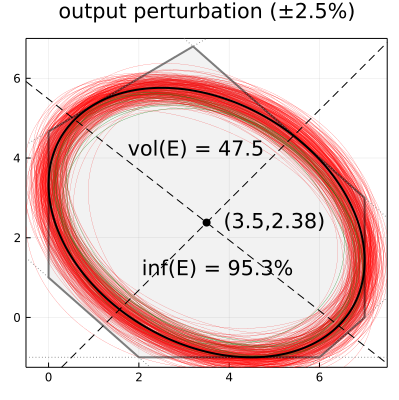

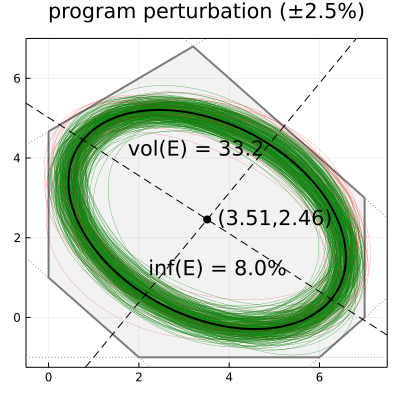

(results_op_025[:inf], results_pp_025[:inf]) = (0.9533333333333334, 0.08)


(0.9533333333333334, 0.08)

In [34]:
# solve stochastic (private) ellipoid fitting problem for b_var = 0.025
set[:b_var] = 0.025
set[:Δ] = sensitivity(set)

# solve stochastic (private) ellipoid fitting problem
vertex = vertices(set)
set[:ξ_v] = vertex[:ξ]
sol_sto =  private_inner_ellipsoid(polyhedral_data[:A],polyhedral_data[:b],set[:ξ_v])

# display output perturbation strategy
results_op_025 = make_perurbed_plot(polyhedral_data,sol_det,set,"output perturbation (±2.5%)")

# display program perturbation strategy
results_pp_025 = make_perurbed_plot(polyhedral_data,sol_sto,set,"program perturbation (±2.5%)")

@show results_op_025[:inf], results_pp_025[:inf]

We conclude by summarizing the results with the following plot

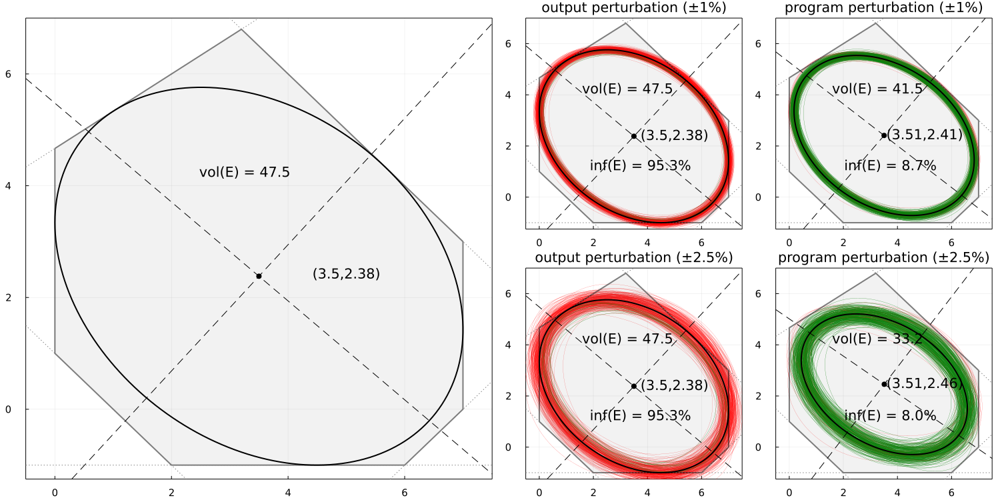

In [35]:
summary_figure = plot(plo_det, results_op_01[:fig], results_pp_01[:fig], results_op_025[:fig], results_pp_025[:fig],
    layout = (@layout [a{0.5w} [grid(2,2)]]), size = (1500, 750),
    xtickfontsize=10, ytickfontsize=10)

display(summary_figure)